## Load In Dependencies

In [2]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap
import folium

# Data Science
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Multi-dimensional arrays and datasets
import xarray as xr

# Geospatial raster data handling
import rioxarray as rxr

# Geospatial data analysis
import geopandas as gpd

# Geospatial operations
import rasterio
from rasterio import windows  
from rasterio import features  
from rasterio import warp
from rasterio.warp import transform_bounds 
from rasterio.windows import from_bounds 

# Image Processing
from PIL import Image

# Coordinate transformations
from pyproj import Proj, Transformer, CRS

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Planetary Computer Tools
import pystac_client
import planetary_computer as pc
from pystac.extensions.eo import EOExtension as eo

# Others
import os
from tqdm import tqdm
import sys


## Response Variable

Before building the model, we need to load in the Urban Heat Island (UHI) index training dataset. We have curated data for the New York region. The dataset consists of geo-locations (Longitude and Latitude), with additional fields including date & time of data collection and the UHI index for each location. 

In [3]:
# Load the training data from csv file and display the first few rows to inspect the data
ground_df = pd.read_csv("../Training_data_uhi_index_2025-02-18.csv")
ground_df.head()

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,24-07-2021 15:53,1.030289
1,-73.909187,40.813045,24-07-2021 15:53,1.030289
2,-73.909215,40.812978,24-07-2021 15:53,1.023798
3,-73.909242,40.812908,24-07-2021 15:53,1.023798
4,-73.909257,40.812845,24-07-2021 15:53,1.021634


In [4]:
data_folder = "../data_pipeline/data/tabular_data/train/"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
        if filename.endswith(".csv"):
            file_path = os.path.join(data_folder, filename)
            df = pd.read_csv(file_path)
            df = df.iloc[:, 1:]
            ground_df = pd.concat([ground_df, df], axis=1)

0it [00:00, ?it/s]

17it [00:00, 21.75it/s]


In [5]:
def calculate_indices(df):
    df['ndvi'] = (df['nir08'] - df['red']) / (df['nir08'] + df['red'])

    # EVI (Enhanced Vegetation Index)
    df["evi"] = 2.5 * (df['nir08'] - df['red']) / (df['nir08'] + 6 * df['red'] - 7.5 * df['blue'] + 1 + 1e-10)

    # SAVI (Soil Adjusted Vegetation Index)
    df["savi"] = (df['nir08'] - df['red']) * 1.5 / (df['nir08'] + df['red'] + 0.5 + 1e-10)

    # GNDVI (Green Normalized Difference Vegetation Index)
    df["gndvi"] = (df['nir08'] - df['green']) / (df['nir08'] + df['green'] + 1e-10)

    # ARVI (Atmospherically Resistant Vegetation Index)
    df["arvi"] = (df['nir08'] - (df['red'] - (df['blue'] - df['red']))) / (df['nir08'] + (df['red'] - (df['blue'] - df['red'])) + 1e-10)

    # MSAVI (Modified Soil-Adjusted Vegetation Index)
    df["msavi"] = (2 * df['nir08'] + 1 - ((2 * df['nir08'] + 1) ** 2 - 8 * (df['nir08'] - df['red'])) ** 0.5) / 2

    # NDWI (Normalized Difference Water Index)
    df['ndwi'] = (df['green'] - df['nir08']) / (df['green'] + df['nir08'])

    # MNDWI (Modified Normalized Difference Water Index)
    df["mndwi"] = (df['green'] - df['swir16']) / (df['green'] + df['swir16'] + 1e-10)

    # AWEI_NSH (Automated Water Extraction Index - No Shadows)
    df["awei_nsh"] = 4 * (df['green'] - df['swir16']) - (0.25 * df['nir08'] + 2.75 * df['swir22'])

    # AWEI_SH (Automated Water Extraction Index - Shadows)
    df["awei_sh"] = df['green'] + 2.5 * df['nir08'] - 1.5 * (df['swir16'] + df['swir22']) - 0.25 * df['blue']

    # NDSI (Normalized Difference Snow Index)
    df["ndsi"] = (df['green'] - df['swir16']) / (df['green'] + df['swir16'] + 1e-10)

    # NBR (Normalized Burn Ratio)
    df["nbr"] = (df['nir08'] - df['swir22']) / (df['nir08'] + df['swir22'] + 1e-10)

    # SI (Shadow Index or Soil Index)
    df["si"] = (df['swir16'] - df['blue']) / (df['swir16'] + df['blue'] + 1e-10)
        
    # NDBI (Normalized Difference Building Index)
    df['ndbi'] = (df['swir16'] - df['nir08']) / (df['swir16'] + df['nir08'])

    # UI (Urban Index)
    df["ui"] = (df['swir16'] - df['red']) / (df['swir16'] + df['red'] + 1e-10)

    # IBI (Index-based Built-up Index)
    df["ibi"] = (df["ndbi"] - (df["savi"] + df["mndwi"])) / (df["ndbi"] + (df["savi"] + df["mndwi"]) + 1e-10)
                                                            
    # Albedo (Surface Reflectance Index)
    df['albedo'] = (0.356 * df['blue'] + 0.130 * df['red'] + 0.373 * df['nir08'] + 0.085 * df['swir16'] + 0.072 * df['swir22'] - 0.018) / 1.016

    # Calculate the VAR (Vertical Aspect Ratio)
    df['var'] = df['building_height'] / df['street_width']
    df['var'] = df['var'].replace([np.inf, -np.inf], np.nan)
    df['var'] = df['var'].replace(np.nan, 1000)

    # Calculate the building's area per pixel area (30 x 30 m^2)
    df['building_area_per_pixel'] = df['building_area'] / (900 * 10.764)
    df['building_area_per_pixel'] = df['building_area_per_pixel'].replace([np.inf, -np.inf], np.nan)

    return df

In [6]:
ground_df = calculate_indices(ground_df)

## Plotting

### Response

In [22]:
import branca.colormap as cm
# Create map
#  [-74.01, 40.75, -73.86, 40.88]
m = folium.Map(location=[40.8, -73.5], zoom_start=7)

colormap = cm.LinearColormap(["green", "yellow", "red"], vmin=ground_df["UHI Index"].min(), vmax=ground_df["UHI Index"].max())
# Add points
for _, row in ground_df.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=1,
        color=colormap(row["UHI Index"]), 
        fill=True,
        fill_opacity=0.7,
    ).add_to(m)

colormap.add_to(m)

m

### Predictors

In [23]:
ground_df.columns

Index(['Longitude', 'Latitude', 'datetime', 'UHI Index', 'aod_47', 'aod_55',
       'building_height', 'building_sd', 'building_year', 'building_area',
       'co', 'hcho', 'red', 'blue', 'green', 'nir08', 'swir16', 'swir22',
       'coastal', 'lwir11', 'no2', 'overlay_level1', 'overlay_level2',
       'sp_level1', 'sp_level2', 'zonedist_level1_100', 'zonedist_level2_100',
       'zonedist_level3_100', 'residence_100', 'manufacture_100',
       'commercial_100', 'park_100', 'zonedist_level1_1000',
       'zonedist_level2_1000', 'zonedist_level3_1000', 'residence_1000',
       'manufacture_1000', 'commercial_1000', 'park_1000',
       'zonedist_level1_200', 'zonedist_level2_200', 'zonedist_level3_200',
       'residence_200', 'manufacture_200', 'commercial_200', 'park_200',
       'zonedist_level1_30', 'zonedist_level2_30', 'zonedist_level3_30',
       'residence_30', 'manufacture_30', 'commercial_30', 'park_30',
       'zonedist_level1_500', 'zonedist_level2_500', 'zonedist_level3_500'

In [7]:
ground_df = ground_df.drop(columns=['datetime'])
ground_df = ground_df.astype('float')

excluded_cols = ['Longitude', 'Latitude', 'UHI Index']
categorical_cols = ['street_traffic', 'street_orientation', 'overlay_level1', 'overlay_level2',
       'sp_level1', 'sp_level2', 'zonedist_level1_100', 'zonedist_level2_100',
       'zonedist_level3_100', 'residence_100', 'manufacture_100',
       'commercial_100', 'park_100', 'zonedist_level1_1000',
       'zonedist_level2_1000', 'zonedist_level3_1000', 'residence_1000',
       'manufacture_1000', 'commercial_1000', 'park_1000',
       'zonedist_level1_200', 'zonedist_level2_200', 'zonedist_level3_200',
       'residence_200', 'manufacture_200', 'commercial_200', 'park_200',
       'zonedist_level1_30', 'zonedist_level2_30', 'zonedist_level3_30',
       'residence_30', 'manufacture_30', 'commercial_30', 'park_30',
       'zonedist_level1_500', 'zonedist_level2_500', 'zonedist_level3_500',
       'residence_500', 'manufacture_500', 'commercial_500', 'park_500']

ground_df[categorical_cols] = ground_df[categorical_cols].astype('int').astype('category')
numerical_cols = ground_df.columns.difference(categorical_cols + excluded_cols)

In [31]:
numerical_cols

Index(['albedo', 'aod_47', 'aod_55', 'arvi', 'awei_nsh', 'awei_sh', 'blue',
       'building_area', 'building_area_per_pixel', 'building_height',
       'building_sd', 'building_year', 'co', 'coastal', 'evi', 'gndvi',
       'green', 'hcho', 'ibi', 'lwir11', 'mndwi', 'msavi', 'nbr', 'ndbi',
       'ndsi', 'ndvi', 'ndwi', 'nir08', 'no2', 'o3', 'population_res1000',
       'red', 'savi', 'si', 'so2', 'street_lane', 'street_width', 'swir16',
       'swir22', 'ui', 'var'],
      dtype='object')

In [32]:
categorical_cols

['street_traffic',
 'street_orientation',
 'overlay_level1',
 'overlay_level2',
 'sp_level1',
 'sp_level2',
 'zonedist_level1_100',
 'zonedist_level2_100',
 'zonedist_level3_100',
 'residence_100',
 'manufacture_100',
 'commercial_100',
 'park_100',
 'zonedist_level1_1000',
 'zonedist_level2_1000',
 'zonedist_level3_1000',
 'residence_1000',
 'manufacture_1000',
 'commercial_1000',
 'park_1000',
 'zonedist_level1_200',
 'zonedist_level2_200',
 'zonedist_level3_200',
 'residence_200',
 'manufacture_200',
 'commercial_200',
 'park_200',
 'zonedist_level1_30',
 'zonedist_level2_30',
 'zonedist_level3_30',
 'residence_30',
 'manufacture_30',
 'commercial_30',
 'park_30',
 'zonedist_level1_500',
 'zonedist_level2_500',
 'zonedist_level3_500',
 'residence_500',
 'manufacture_500',
 'commercial_500',
 'park_500']

In [8]:
import sys
import os

sys.path.append(os.path.abspath("../src"))
import eda
# from src.eda import EDA

stat_eda = eda.EDA(ground_df)
stat_eda.explore_stats().to_csv('eda_features.csv', index=False)

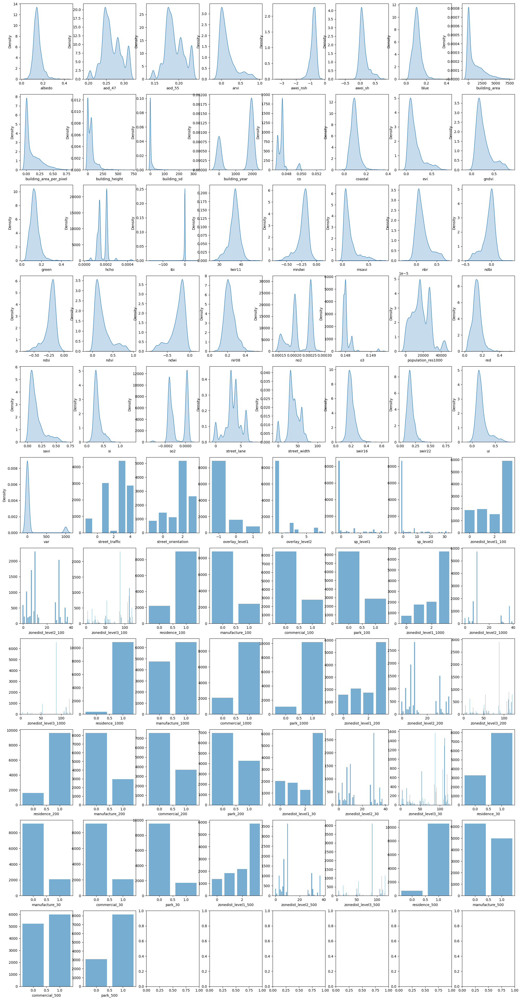

In [ ]:
df_plot = ground_df.copy()

# Create Pair Plot Grid
fig, axes = plt.subplots(11, 8, figsize=(25, 50))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(list(numerical_cols) + list(categorical_cols)):
    ax = axes[i]

    if col in numerical_cols:
        sns.kdeplot(df_plot[col], fill=True, ax=ax)
    else:
        counts = df_plot[col].value_counts()
        ax.bar(counts.index, counts.values, alpha=0.6)
    
    ax.set_xlabel(col)

plt.show()

<Axes: >

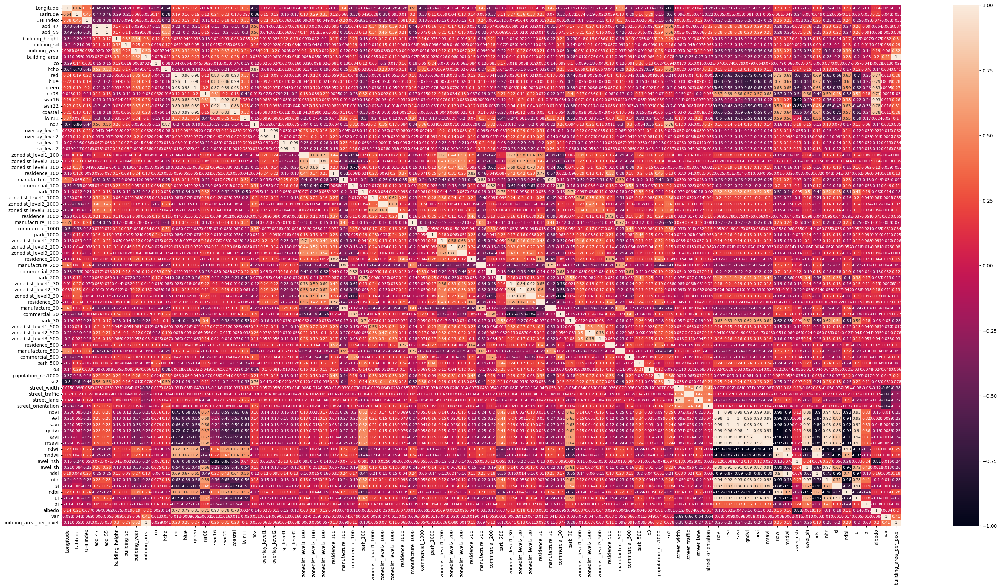

In [37]:
df_corr = df_plot.corr()

plt.figure(figsize=(40, 20))
sns.heatmap(df_corr, annot=True, annot_kws={"fontsize":8})

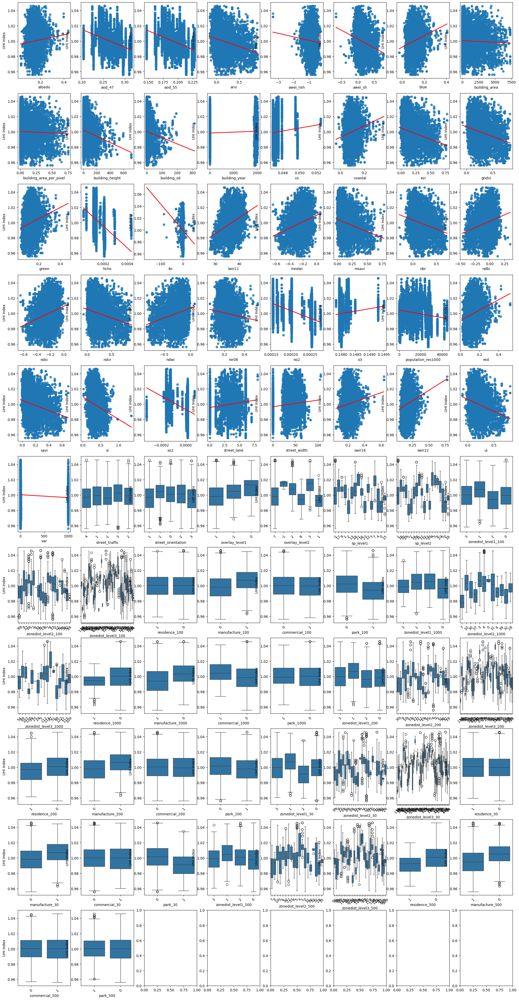

In [38]:
# Plot relationship with UHI index

# Create Pair Plot Grid
fig, axes = plt.subplots(11, 8, figsize=(25, 50))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(list(numerical_cols) + list(categorical_cols)):
    ax = axes[i]

    if col in numerical_cols:

        sns.regplot(x=col, y="UHI Index", data=df_plot, ax=ax, ci=None, line_kws={'color': 'red', 'linewidth': 2})
    else:
        sns.boxplot(x=df_plot[col], y=df_plot['UHI Index'], ax=ax)
        ax.set_xticklabels(df_plot[col].unique(), rotation=45)
    
    ax.set_xlabel(col)

plt.show()

## Train Models

In [83]:
excluded_feautures = [
    'aod_47',
    'overlay_level2', 'sp_level1', 'sp_level2', 'zonedist_level3_30', 'zonedist_level2_30', 'residence_30',
    'manufacture_30', 'commercial_30', 'park_30', 
    'zonedist_level1_100',
    'zonedist_level2_100', 'zonedist_level3_100', 'zonedist_level1_200',
    'zonedist_level2_200', 'zonedist_level3_200', 'zonedist_level1_500',
    'zonedist_level2_500', 'zonedist_level3_500', 'zonedist_level1_1000',
    'zonedist_level2_1000', 'zonedist_level3_1000'
]

cat_col_included = list(set(categorical_cols) - set(excluded_feautures))
num_col_included = list(set(numerical_cols) - set(excluded_feautures))

In [10]:
sys.path.append(os.path.abspath("../ml_pipeline"))
import ml_models

In [11]:
rf = RandomForestRegressor(n_estimators=100)

save_folder = "../ml_pipeline/diagnostic_data/"
r2, model = ml_models.run_experiment(df=ground_df[['UHI Index'] + cat_col_included + num_col_included], 
                         test_size=0.3, 
                         target='UHI Index', 
                         numerical_features=num_col_included, 
                         categorical_features=cat_col_included, 
                         model=rf,
                         save_folder=save_folder)
print(r2)

0.9337500153526288


In [12]:
from catboost import CatBoostRegressor, Pool

cb = CatBoostRegressor(iterations=5000, learning_rate=0.05, depth=10, loss_function='RMSE', verbose=100)
r2_cb, cb_pipeline = ml_models.run_experiment(df=ground_df[['UHI Index'] + cat_col_included + num_col_included], 
                         test_size=0.3, 
                         target='UHI Index', 
                         numerical_features=num_col_included, 
                         categorical_features=cat_col_included, 
                         model=cb,
                         save_folder=save_folder)
print(r2_cb)

0:	learn: 0.0158284	total: 239ms	remaining: 19m 54s
100:	learn: 0.0065390	total: 8.85s	remaining: 7m 9s
200:	learn: 0.0048610	total: 16.9s	remaining: 6m 44s
300:	learn: 0.0038468	total: 24.9s	remaining: 6m 28s
400:	learn: 0.0032283	total: 33.4s	remaining: 6m 23s
500:	learn: 0.0028251	total: 42.4s	remaining: 6m 20s
600:	learn: 0.0025270	total: 50.7s	remaining: 6m 10s
700:	learn: 0.0023146	total: 58.9s	remaining: 6m 1s
800:	learn: 0.0021501	total: 1m 8s	remaining: 5m 56s
900:	learn: 0.0020286	total: 1m 16s	remaining: 5m 47s
1000:	learn: 0.0019319	total: 1m 23s	remaining: 5m 33s
1100:	learn: 0.0018586	total: 1m 30s	remaining: 5m 20s
1200:	learn: 0.0017995	total: 1m 38s	remaining: 5m 11s
1300:	learn: 0.0017508	total: 1m 46s	remaining: 5m 1s
1400:	learn: 0.0017128	total: 1m 53s	remaining: 4m 52s
1500:	learn: 0.0016812	total: 2m 1s	remaining: 4m 43s
1600:	learn: 0.0016578	total: 2m 9s	remaining: 4m 35s
1700:	learn: 0.0016350	total: 2m 17s	remaining: 4m 27s
1800:	learn: 0.0016151	total: 2m 25

In [101]:
from xgboost import XGBRegressor

xgb = XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=10, min_child_weight=5, colsample_bytree=1, subsample=0.8, random_state=42)
r2_xgb, xgb_pipeline = ml_models.run_experiment(df=ground_df[['UHI Index'] + cat_col_included + num_col], 
                         test_size=0.3, 
                         target='UHI Index', 
                         numerical_features=num_col, 
                         categorical_features=cat_col_included, 
                         model=xgb,
                         save_folder=save_folder)
print(r2_xgb)

0.943412350358577


## Submission 

In [102]:
submission_data_path = '../Submission_template_UHI2025-v2.csv' 
test_file = pd.read_csv(submission_data_path)
test_file

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,NaN
1,-73.971928,40.788875,NaN
2,-73.967080,40.789080,NaN
3,-73.972550,40.789082,NaN
4,-73.969697,40.787953,NaN
...,...,...,...
1035,-73.919388,40.813803,NaN
1036,-73.931033,40.833178,NaN
1037,-73.934647,40.854542,NaN
1038,-73.917223,40.815413,NaN


In [103]:
submission_folder = "../data_pipeline/data/tabular_data/submission/"
for i, filename in tqdm(enumerate(os.listdir(submission_folder))):
        if filename.endswith(".csv"):
            file_path = os.path.join(submission_folder, filename)
            df = pd.read_csv(file_path)
            df = df.iloc[:, 1:]
            test_file = pd.concat([test_file, df], axis=1)

17it [00:00, 197.99it/s]


In [104]:
test_file = calculate_indices(test_file)
test_file = test_file.astype('float')
test_file[categorical_cols] = test_file[categorical_cols].astype('int').astype('category')

In [106]:
final_predictions = pd.Series(xgb_pipeline.predict(test_file[cat_col_included + num_col]))
submission_df = pd.DataFrame({'Longitude':test_file['Longitude'].values, 'Latitude':test_file['Latitude'].values, 'UHI Index':final_predictions.values})

In [107]:
submission_df

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,0.964786
1,-73.971928,40.788875,0.964786
2,-73.967080,40.789080,0.965164
3,-73.972550,40.789082,0.961355
4,-73.969697,40.787953,0.958289
...,...,...,...
1035,-73.919388,40.813803,1.043265
1036,-73.931033,40.833178,1.043408
1037,-73.934647,40.854542,1.040319
1038,-73.917223,40.815413,1.039038


In [108]:
submission_df.to_csv("../submissions/xgb_all_features_zoning_filtered_air_pop_fixed_pipeline_remove_building_area.csv", index = False)

## Residual Diagnose

In [54]:
rf_result = pd.read_csv("../ml_pipeline/diagnostic_data/RandomForestRegressor_baseline.csv", index_col='Unnamed: 0')
xgb_result = pd.read_csv("../ml_pipeline/diagnostic_data/XGBRegressor_baseline.csv", index_col='Unnamed: 0')
cb_result = pd.read_csv("../ml_pipeline/diagnostic_data/CatBoostRegressor_baseline.csv", index_col='Unnamed: 0')

rf_result['lat'] = ground_df['Latitude']
xgb_result['lat'] = ground_df['Latitude']
cb_result['lat'] = ground_df['Latitude']

rf_result['long'] = ground_df['Longitude']
xgb_result['long'] = ground_df['Longitude']
cb_result['long'] = ground_df['Longitude']


0
2
4


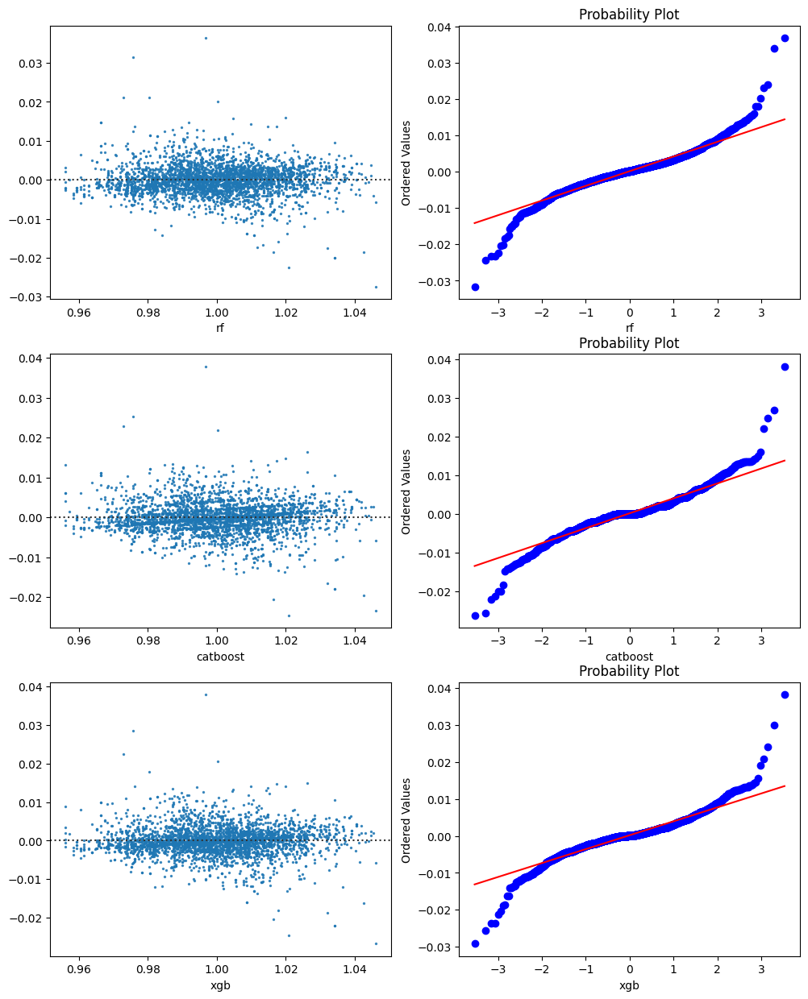

In [65]:
import scipy.stats as stats

fig, axes = plt.subplots(3, 2, figsize=(12, 15))
axes = axes.flatten()

# Iterate over all pairs
results = [rf_result, cb_result, xgb_result]
results_name = ['rf', 'rf', 'catboost', 'catboost', 'xgb', 'xgb']

i = 0
for result in results:
    print(i)
    residuals = result['y_pred'] - result['y_test']
    sns.residplot(x=result['y_test'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[i])
    axes[i].set_xlabel(results_name[i])
    
    i += 1
    stats.probplot(residuals, dist="norm", plot=axes[i])
    axes[i].set_xlabel(results_name[i])

    i += 1

plt.show()

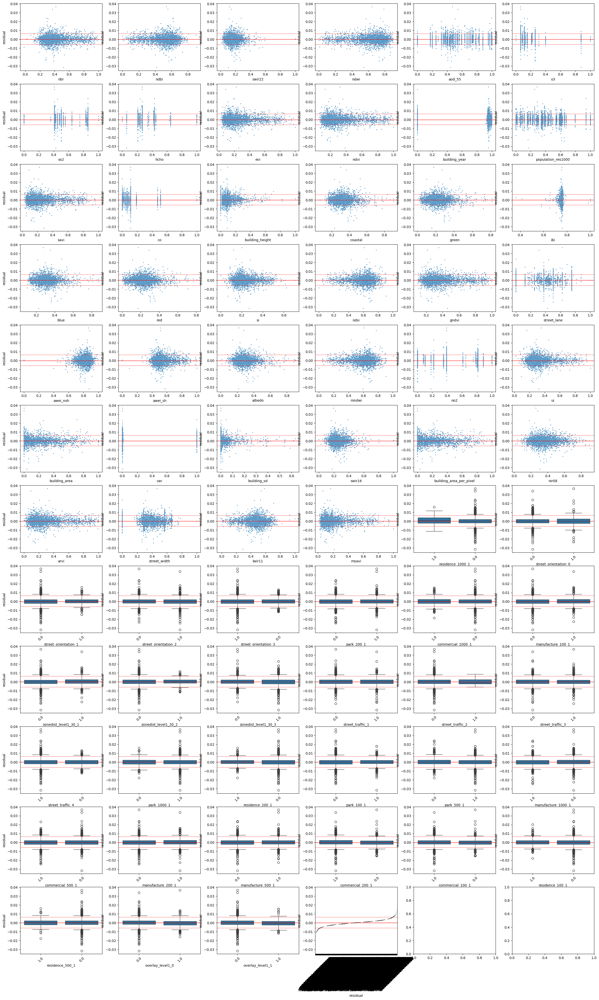

In [38]:
res_plot_df = rf_result.copy()
res_plot_df['residual'] = res_plot_df['y_pred'] - res_plot_df['y_test']
res_plot_df = res_plot_df.drop(columns=['y_pred', 'y_test'])

fig, axes = plt.subplots(12, 6, figsize=(30, 50))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(res_plot_df.columns):
    ax = axes[i]

    if col in num_col_included:
        sns.scatterplot(x=col, y="residual", data=res_plot_df, ax=ax, s=5)
    else:
        sns.boxplot(x=res_plot_df[col], y=res_plot_df['residual'], ax=ax)
        ax.set_xticklabels(res_plot_df[col].unique(), rotation=45)

    ax.axhline(0, color='red', linewidth=1)
    ax.axhline(np.percentile(residuals, 95), color='red', linewidth=0.5)
    ax.axhline(np.percentile(residuals, 5), color='red', linewidth=0.5)
    ax.set_xlabel(col)

plt.show()

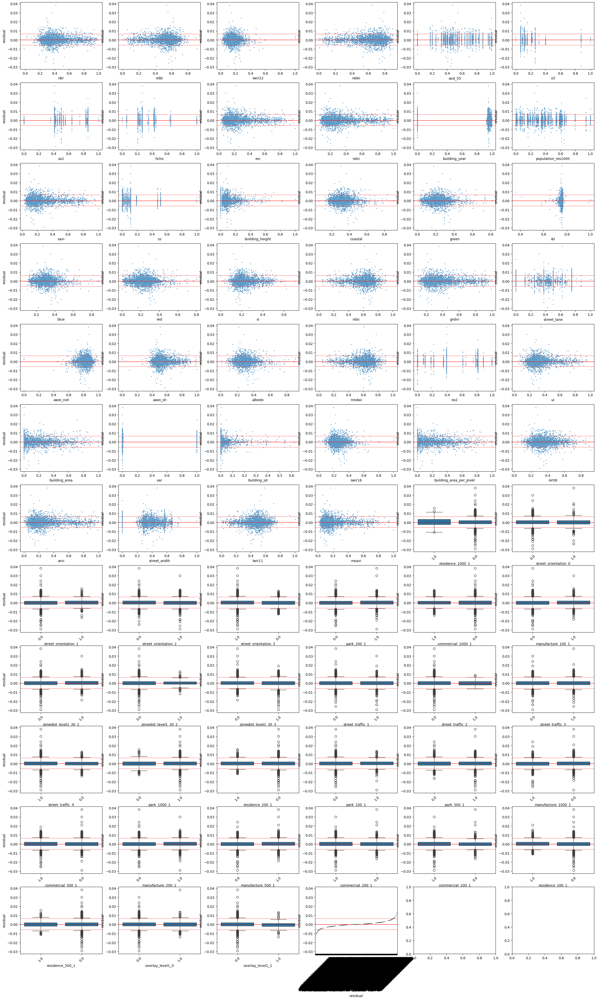

In [42]:
res_plot_df = xgb_result.copy()
res_plot_df['residual'] = res_plot_df['y_pred'] - res_plot_df['y_test']
res_plot_df = res_plot_df.drop(columns=['y_pred', 'y_test'])

fig, axes = plt.subplots(12, 6, figsize=(30, 50))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(res_plot_df.columns):
    ax = axes[i]

    if col in num_col_included:
        sns.scatterplot(x=col, y="residual", data=res_plot_df, ax=ax, s=5)
    else:
        sns.boxplot(x=res_plot_df[col], y=res_plot_df['residual'], ax=ax)
        ax.set_xticklabels(res_plot_df[col].unique(), rotation=45)

    ax.axhline(0, color='red', linewidth=1)
    ax.axhline(np.percentile(residuals, 95), color='red', linewidth=0.5)
    ax.axhline(np.percentile(residuals, 5), color='red', linewidth=0.5)
    ax.set_xlabel(col)

plt.show()

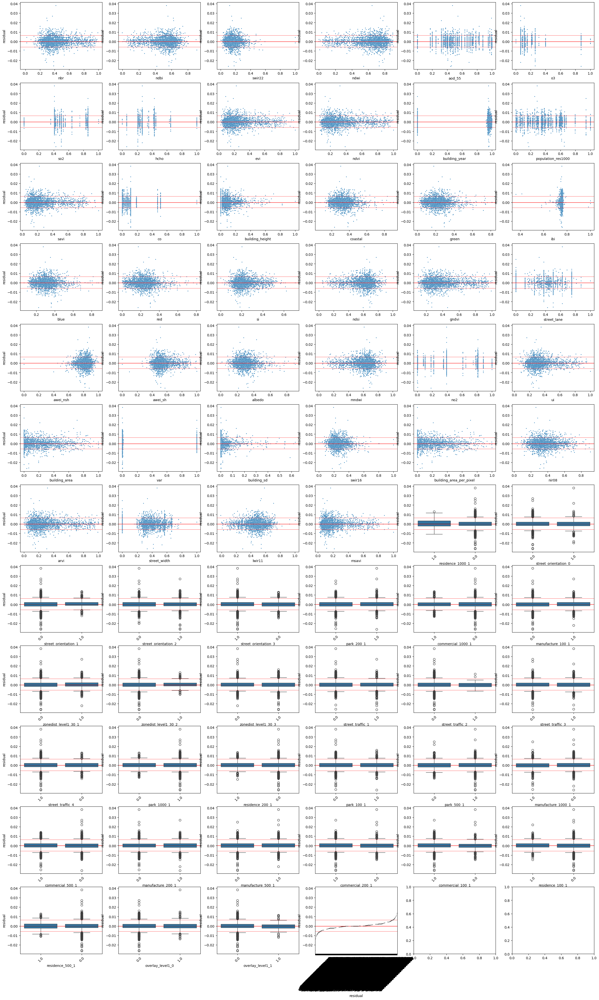

In [43]:
res_plot_df = cb_result.copy()
res_plot_df['residual'] = res_plot_df['y_pred'] - res_plot_df['y_test']
res_plot_df = res_plot_df.drop(columns=['y_pred', 'y_test'])

fig, axes = plt.subplots(12, 6, figsize=(30, 50))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(res_plot_df.columns):
    ax = axes[i]

    if col in num_col_included:
        sns.scatterplot(x=col, y="residual", data=res_plot_df, ax=ax, s=5)
    else:
        sns.boxplot(x=res_plot_df[col], y=res_plot_df['residual'], ax=ax)
        ax.set_xticklabels(res_plot_df[col].unique(), rotation=45)

    ax.axhline(0, color='red', linewidth=1)
    ax.axhline(np.percentile(residuals, 95), color='red', linewidth=0.5)
    ax.axhline(np.percentile(residuals, 5), color='red', linewidth=0.5)
    ax.set_xlabel(col)

plt.show()

In [98]:
xgb = XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=10, min_child_weight=5, colsample_bytree=1, subsample=0.8, random_state=42)

all_cols = cat_col_included + num_col_included

num_col = list(feature_df['Feature']).copy()
cat_col = cat_col_included.copy()

best_xgb = r2_xgb
for col in list(feature_df['Feature']):
    num_col.remove(col)
    
    r2_xgb_feats, xgb_pipeline_feats = ml_models.run_experiment(df=ground_df[['UHI Index'] + num_col + cat_col_included], 
                            test_size=0.3, 
                            target='UHI Index', 
                            numerical_features=num_col, 
                            categorical_features=cat_col_included, 
                            model=xgb,
                            save_folder=save_folder + "feature_selection/")
    
    print(f"Best r2: {best_xgb}. Remove {col}, r2: {r2_xgb_feats}")

    if (r2_xgb_feats < best_xgb):
        num_col.append(col)
    if (r2_xgb_feats >= best_xgb):
        best_xgb = r2_xgb_feats
    
    

Best r2: 0.9411966021005992. Remove building_area_per_pixel, r2: 0.9419010050403115
Best r2: 0.9419010050403115. Remove mndwi, r2: 0.9421090513179953
Best r2: 0.9421090513179953. Remove building_area, r2: 0.943412350358577
Best r2: 0.943412350358577. Remove gndvi, r2: 0.9425379008753286
Best r2: 0.943412350358577. Remove blue, r2: 0.9425479454625326
Best r2: 0.943412350358577. Remove ndbi, r2: 0.9428176030867015
Best r2: 0.943412350358577. Remove swir22, r2: 0.9421131535933674
Best r2: 0.943412350358577. Remove ndsi, r2: 0.9427492526238463
Best r2: 0.943412350358577. Remove green, r2: 0.9429340775689666
Best r2: 0.943412350358577. Remove arvi, r2: 0.9423973851185083
Best r2: 0.943412350358577. Remove coastal, r2: 0.9421498081513929
Best r2: 0.943412350358577. Remove building_year, r2: 0.9427735067564667
Best r2: 0.943412350358577. Remove si, r2: 0.9415299495905899
Best r2: 0.943412350358577. Remove swir16, r2: 0.942335587300529
Best r2: 0.943412350358577. Remove ndwi, r2: 0.94136754137

In [77]:
import branca.colormap as cm

xgb_result['residual'] = xgb_result['y_pred'] - xgb_result['y_test']
pct_95 = np.percentile(xgb_result['residual'], 95)
pct_5 = np.percentile(xgb_result['residual'], 5)
xgb_plot = xgb_result.loc[(xgb_result['residual'] > pct_95) |  (xgb_result['residual'] < pct_5), :]


m = folium.Map(location=[40.8, -73.5], zoom_start=7)

colormap = cm.LinearColormap(["green", "yellow", "red"], vmin=xgb_plot['residual'].min(), vmax=xgb_plot['residual'].max())
# Add points
for _, row in xgb_plot.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=1,
        color=colormap(row["residual"]), 
        fill=True,
        fill_opacity=0.7,
    ).add_to(m)

colormap.add_to(m)

m

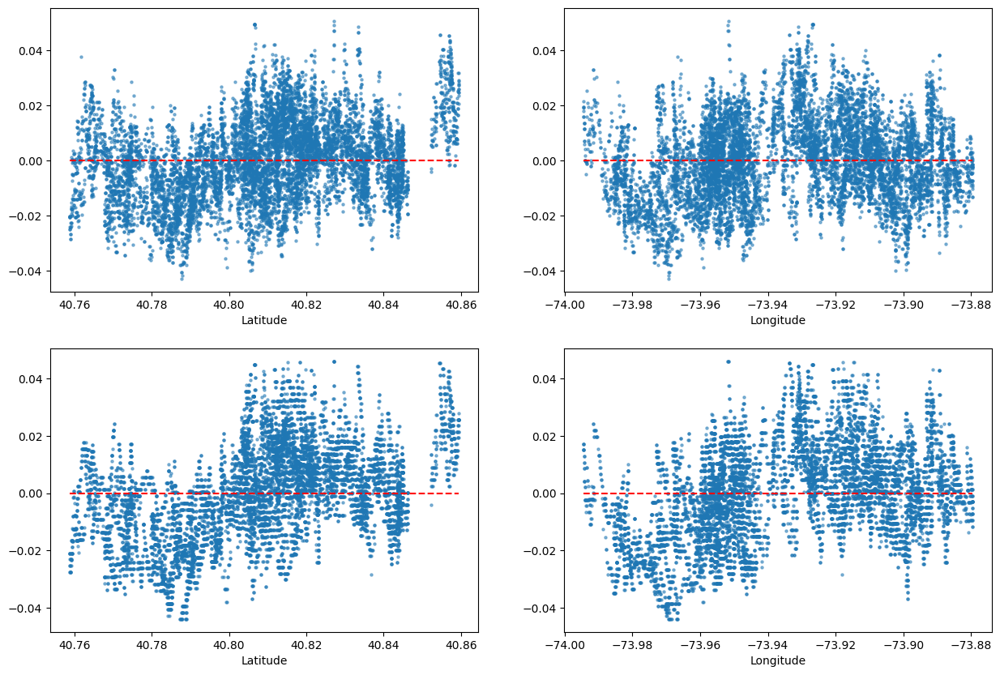

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

axes[0].scatter(df['Latitude'], df_pred['residual'], alpha=0.5, s=5)
axes[0].hlines(y=0, xmin=df['Latitude'].min(), xmax=df['Latitude'].max(), color='red', linestyle='--')  # Reference line at y=0
axes[0].set_xlabel("Latitude")

axes[1].scatter(df['Longitude'], df_pred['residual'], alpha=0.5, s=5)
axes[1].hlines(y=0, xmin=df['Longitude'].min(), xmax=df['Longitude'].max(), color='red', linestyle='--')  # Reference line at y=0
axes[1].set_xlabel("Longitude")

axes[2].scatter(df['Latitude'], df_pred['UHI Index'] - df_pred['UHI Index'].mean(), alpha=0.5, s=5)
axes[2].hlines(y=0, xmin=df['Latitude'].min(), xmax=df['Latitude'].max(), color='red', linestyle='--')  # Reference line at y=0
axes[2].set_xlabel("Latitude")

axes[3].scatter(df['Longitude'], df_pred['UHI Index'] - df_pred['UHI Index'].mean(), alpha=0.5, s=5)
axes[3].hlines(y=0, xmin=df['Longitude'].min(), xmax=df['Longitude'].max(), color='red', linestyle='--')  # Reference line at y=0
axes[3].set_xlabel("Longitude")

plt.show()